<a href="https://colab.research.google.com/github/VladislavTokarev02/technical/blob/main/test_task_(3).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Тестовое задание для кандидата в команду валидации Альфа-Банка

**Привет!** На связи команда валидации Альфа-Банка. Мы отвечаем за то, чтобы модели, которые используются для принятия решений, были надежными, справедливыми и понятными. Твое задание — провести моделирование и валидацию кредитной модели. Удачи, и помни: мы верим в твои силы! 💪  

---

## Цель  
Проверить навыки анализа данных, валидации ML-моделей и умение формулировать выводы для бизнеса.  

---

## Датасет  
**Название:** [Give Me Some Credit](https://www.kaggle.com/c/GiveMeSomeCredit/data)  
**Описание:**  
Прогнозирование дефолта заемщика на основе финансовых и демографических признаков.  

**Признаки:**  
- `RevolvingUtilizationOfUnsecuredLines` (использование кредитных линий),  
- `age`, `MonthlyIncome`, `NumberOfDependents` и др.  

**Целевая переменная:** `SeriousDlqin2yrs` (дефолт: 0/1).  

---

## Задача  
Проведите валидацию модели кредитного скоринга (логистическая регрессия или градиентный бустинг) и подготовьте отчет.  

---

## Шаги  

### 1. Анализ и предобработка данных  
- Обработайте пропуски (например, в `MonthlyIncome`).  
- Исследуйте выбросы (например, возраст < 18 лет).  
- Визуализируйте распределения ключевых признаков.  
- Предложите методы борьбы с дисбалансом классов.  

### 2. Построение и оценка модели  
- Разделите данные на train/validation/test.  
- Обучите модель (логистическая регрессия или CatBoost/XGBoost).  
- Рассчитайте метрики: **AUC-ROC, Precision, Recall, F1-Score**.  
- Проверьте устойчивость модели через кросс-валидацию (5 folds).  

### 3. Интерпретация и этика  
- Выделите **топ-5 признаков**, влияющих на прогноз (SHAP/LIME).  
- Проверьте логичность влияния признаков (например, высокая долговая нагрузка → выше риск дефолта).  
- Оцените fairness модели: сравните метрики (FPR, TPR) для групп (например, **молодые** vs **старше 40 лет**).  

### 4. Отчет  
Подготовьте общие выводы по проведенной валидации, включив:  
- Выводы о качестве модели и её ограничениях.  
- Рекомендации по улучшению (например, сбор дополнительных данных).  
- Пример: *«Как изменится прогноз, если у заемщика появится иждивенец?»*  

---

## Технические требования  
- Язык: **Python** (Jupyter Notebook).  
- Код должен быть читаемым и содержать комментарии.  

---

## Критерии оценки  
1. Глубина анализа данных и обработки выбросов.  
2. Корректность выбранных метрик и их интерпретация.  
3. Качество визуализаций (распределения, важность признаков).  
4. Практичность рекомендаций в отчете.    

---

**Срок выполнения:** 7 дней.  
**Формат сдачи:**  
- Ноутбук в Collab/GitHub-репозиторий.    

---

Это задание покажет, как вы подходите к анализу реальных данных и делаете ML-модели прозрачными для бизнеса. Ждем твою работу! 🚀  

In [20]:
!pip install ydata_profiling -q

In [2]:
!pip install catboost -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 397.6 kB/s eta 0:00:00


In [56]:
import pandas as pd
import random
import numpy as np
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.utils.class_weight import compute_class_weight
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, classification_report, roc_curve, auc, precision_recall_curve, r2_score, average_precision_score
from catboost import CatBoostClassifier
from sklearn.calibration import CalibratedClassifierCV, IsotonicRegression, calibration_curve


import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [3]:
#data_dict = pd.read_excel('Data Dictionary.xls')

Интерпретация столбцов датасета из data_dict

| Имя переменной                      | Описание                                                                                                                                         |
|-----------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------|
| SeriousDlqin2yrs                    | Лицо имело задолженность 90+ дней или более за последние 2 года.                                                                                      |
| RevolvingUtilizationOfUnsecuredLines| Общий баланс по кредитным картам и персональным кредитным линиям (без недвижимости и займов на покупку авто) делённый на сумму кредитных лимитов.     |
| age                                 | Возраст заёмщика в годах.                                                                                                                            |
| NumberOfTime30-59DaysPastDueNotWorse| Количество случаев, когда заёмщик был в просрочке 30–59 дней, но не более, за последние 2 года.                                                      |
| DebtRatio                           | Соотношение ежемесячных платежей по долгам (алименты, расходы на жизнь и т. д.) к ежемесячному валовому доходу.                                       |
| MonthlyIncome                       | Ежемесячный доход.                                                                                                                                   |
| NumberOfOpenCreditLinesAndLoans     | Количество открытых кредитов (автокредит или ипотека) и кредитных линий (например, кредитные карты).                                                 |
| NumberOfTimes90DaysLate             | Количество случаев, когда заёмщик был в просрочке на 90 дней или более.                                                                              |
| NumberRealEstateLoansOrLines        | Количество займов под недвижимость, включая кредитные линии на недвижимость.                                                                         |
| NumberOfTime60-89DaysPastDueNotWorse| Количество случаев, когда заёмщик был в просрочке 60–89 дней, но не более, за последние 2 года.                                                      |
| NumberOfDependents                  | Количество иждивенцев в семье (исключая самого заёмщика, супругу/супруга и т. д.).                                                                    |

In [5]:
train = pd.read_csv('cs-training.csv', index_col = 0).reset_index(drop = True)
train.head()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [6]:
test = pd.read_csv('cs-test.csv', index_col = 0).reset_index(drop = True)
test.head()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,NaN,0.885519,43,0,0.177513,5700.0,4,0,0,0,0.0
1,NaN,0.463295,57,0,0.527237,9141.0,15,0,4,0,2.0
2,NaN,0.043275,59,0,0.687648,5083.0,12,0,1,0,2.0
3,NaN,0.280308,38,1,0.925961,3200.0,7,0,2,0,0.0
4,NaN,1.000000,27,0,0.019917,3865.0,4,0,0,0,1.0


In [7]:
train.shape, test.shape

((150000, 11), (101503, 11))

В качестве первого быстрого ознакомления с данными можно воспользоваться дашбородом в ydata_profiling

In [7]:
profile_report_train = ProfileReport(train, title='EDA Report for train')
profile_report_test = ProfileReport(test, title = 'EDA Report for test')

profile_report_train
#вывод дашборда на экран

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Что можно сказать по данным:
- распределения признаков между трейном и тестом оказались схожими.
- наблюдается дисбаланс классов: 93.3% отрицательного класса против 6.7% положительно. В целом неудивительно - у банка должно быть подавляющее большинство благонадёжных заёмщиков.

<b> Рассмотрим более детально датасеты

In [8]:
train.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [9]:
test.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,0.0,101503.000000,101503.000000,101503.000000,101503.000000,8.140000e+04,101503.000000,101503.000000,101503.000000,101503.000000,98877.000000
mean,NaN,5.310000,52.405436,0.453770,344.475020,6.855036e+03,8.453514,0.296691,1.013074,0.270317,0.769046
std,NaN,196.156039,14.779756,4.538487,1632.595231,3.650860e+04,5.144100,4.515859,1.110253,4.503578,1.136778
min,NaN,0.000000,21.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,0.030131,41.000000,0.000000,0.173423,3.408000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,0.152586,52.000000,0.000000,0.364260,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,NaN,0.564225,63.000000,0.000000,0.851619,8.200000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,NaN,21821.000000,104.000000,98.000000,268326.000000,7.727000e+06,85.000000,98.000000,37.000000,98.000000,43.000000


In [10]:
train.duplicated().sum(), test.duplicated().sum()
# обнаружил полные дубликаты

(609, 328)

In [11]:
train = train.drop_duplicates()
test = test.drop_duplicates()
# удаление дубликатов

In [12]:
train.isna().mean().round(4).to_frame().sort_values(by=0, ascending = False).style.format('{:.2%}').background_gradient('coolwarm')
# визуализация пропусков

,0
MonthlyIncome,19.56%
NumberOfDependents,2.56%
SeriousDlqin2yrs,0.00%
RevolvingUtilizationOfUnsecuredLines,0.00%
age,0.00%
NumberOfTime30-59DaysPastDueNotWorse,0.00%
DebtRatio,0.00%
NumberOfOpenCreditLinesAndLoans,0.00%
NumberOfTimes90DaysLate,0.00%
NumberRealEstateLoansOrLines,0.00%


In [13]:
test.isna().mean().round(4).to_frame().sort_values(by=0, ascending = False).style.format('{:.2%}').background_gradient('coolwarm')
# визуализация пропусков

,0
SeriousDlqin2yrs,100.00%
MonthlyIncome,19.60%
NumberOfDependents,2.54%
RevolvingUtilizationOfUnsecuredLines,0.00%
age,0.00%
NumberOfTime30-59DaysPastDueNotWorse,0.00%
DebtRatio,0.00%
NumberOfOpenCreditLinesAndLoans,0.00%
NumberOfTimes90DaysLate,0.00%
NumberRealEstateLoansOrLines,0.00%


Как мы видим - пропуски есть только в 2 столбцах - ежемесячный доход и количество иждивенцев в семье.

- Количество иждивенцев в семье: доля пропусков немного выше 2.5% - это не столь существенно для анализа, таким образом, можно просто удалить эти пропуски без заполнения. Можно было бы также заполнить модой или выбрать более интересную стратегию, но при таком малом количестве пропусков можно перейти в сторону "чистоты" данных.
- Ежемесячный доход: в простейшем случае можно заполнить медианой, хотя существуют вариации заполнения с учётом k-ближайших соседей, линейной регрессии, k-means. В виду того, что пропусков много (~20% от всех данных) воспользуемся продвинутыми методами.

In [14]:
train.dropna(subset=['NumberOfDependents'], inplace=True)
test.dropna(subset=['NumberOfDependents'], inplace=True)

Первая стратегия: заполнение пропусков MonthlyIncome при помощи KNN

In [16]:
# target_column = 'SeriousDlqin2yrs'  # Столбец с таргетом

# # Создаем копии данных
# train_knn = train.copy()
# test_knn = test.copy()

# # Применяем KNNImputer для заполнения пропусков в столбцах (кроме таргета)
# imputer = KNNImputer(n_neighbors=5)

# # Применяем KNNImputer к тренировочным данным, исключив таргет
# train_data = train_knn.drop(columns=[target_column])
# train_knn[train_data.columns] = imputer.fit_transform(train_data)

# # Применяем тот же KNNImputer к тестовым данным, исключив таргет
# test_data = test_knn.drop(columns=[target_column])
# test_knn[test_data.columns] = imputer.transform(test_data)

# # Столбец с таргетом остается неизменным, так как мы не трогаем его в train_knn и test_knn
# # Просто добавляем таргет обратно в тестовые данные (он уже на своем месте)
# test_knn[target_column] = test[target_column]

In [17]:
# train_knn.to_csv('train_knn.csv', index = False)
# test_knn.to_csv('test_knn.csv', index = False)

Вторая стратегия: заполнение пропусков MonthlyIncome при помощи случайного леса.

In [19]:
train_nan = train[train['MonthlyIncome'].isnull()]
train_no_nan = train.dropna(subset=['MonthlyIncome'])

# Разделяем данные на признаки (X) и целевую переменную (y) для тренировочного набора без пропусков
X_train = train_no_nan.drop(columns=['MonthlyIncome'])
y_train = train_no_nan['MonthlyIncome']

# Настройка гиперпараметров для RandomForestRegressor
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8]
}

# Инициализация модели
rf = RandomForestRegressor(random_state=42)

# Поиск лучших гиперпараметров с помощью GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Лучшая модель после поиска
best_rf = grid_search.best_estimator_

# Прогнозируем пропущенные значения в столбце 'MonthlyIncome' для тренировочного набора
X_nan = train_nan.drop(columns=['MonthlyIncome'])
predicted_income_train = best_rf.predict(X_nan)

# Заполняем пропуски предсказанными значениями в тренировочном наборе
train_rf = train.copy()
train_rf.loc[train_rf['MonthlyIncome'].isnull(), 'MonthlyIncome'] = predicted_income_train

# Прогнозируем пропущенные значения в столбце 'MonthlyIncome' для тестового набора
X_test = test.drop(columns=['MonthlyIncome'])
predicted_income_test = best_rf.predict(X_test)

# Заполняем пропуски предсказанными значениями в тестовом наборе
test_rf = test.copy()
test_rf['MonthlyIncome'] = predicted_income_test

# Выводим лучшие параметры и качество модели
print("Лучшие параметры модели:", grid_search.best_params_)
print("Качество модели на обучающей выборке:", best_rf.score(X_train, y_train))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Лучшие параметры модели: {'max_depth': 20, 'min_samples_leaf': 8, 'min_samples_split': 2, 'n_estimators': 500}
Качество модели на обучающей выборке: 0.35805717808624793


In [24]:
train_nan = train[train['MonthlyIncome'].isnull()]
train_no_nan = train.dropna(subset=['MonthlyIncome'])

# Разделяем данные на признаки (X) и целевую переменную (y) для тренировочного набора без пропусков
X_train = train_no_nan.drop(columns=['MonthlyIncome'])
y_train = train_no_nan['MonthlyIncome']

# Масштабирование данных (если необходимо)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Настройка гиперпараметров для RandomForestRegressor
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 8],
    'min_samples_leaf': [2, 4, 6],
    'max_features': ['auto', 'sqrt', None]
}

# Инициализация модели
rf = RandomForestRegressor(random_state=42)

# Поиск лучших гиперпараметров с помощью GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Лучшая модель после поиска
best_rf = grid_search.best_estimator_

# Выводим лучшие параметры модели
print("Лучшие параметры модели:", grid_search.best_params_)

# Прогнозируем пропущенные значения в столбце 'MonthlyIncome' для тренировочного набора
X_nan = train_nan.drop(columns=['MonthlyIncome'])
X_nan_scaled = scaler.transform(X_nan)  # Масштабируем также данные с пропусками
predicted_income_train = best_rf.predict(X_nan_scaled)

# Заполняем пропуски предсказанными значениями в тренировочном наборе
train_rf = train.copy()
train_rf.loc[train_rf['MonthlyIncome'].isnull(), 'MonthlyIncome'] = predicted_income_train

# Прогнозируем пропущенные значения в столбце 'MonthlyIncome' для тестового набора
X_test = test.drop(columns=['MonthlyIncome'])
X_test_scaled = scaler.transform(X_test)  # Масштабируем тестовые данные
predicted_income_test = best_rf.predict(X_test_scaled)

# Заполняем пропуски предсказанными значениями в тестовом наборе
test_rf = test.copy()
test_rf['MonthlyIncome'] = predicted_income_test

# Оценка качества модели на обучающих данных
train_r2 = best_rf.score(X_train_scaled, y_train)
print(f"Качество модели на обучающей выборке: {train_r2}")

# Оценка модели на тестовом наборе
y_test = test_rf['MonthlyIncome']
r2_test = r2_score(y_test, predicted_income_test)
print(f'R² на тестовых данных: {r2_test}')

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


KeyboardInterrupt: 

In [20]:
train_rf.to_csv('train_rf.csv', index = False)
test_rf.to_csv('test_rf.csv', index = False)

In [25]:
train_rf = pd.read_csv('train_rf.csv')
test_rf = pd.read_csv('test_rf.csv')

In [26]:
int_cols = ['age', 'NumberOfTime30-59DaysPastDueNotWorse', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents']
for i in train_rf[int_cols]:
  train_rf[i] = train_rf[i].astype('int')
for i in test_rf[int_cols]:
  test_rf[i] = test_rf[i].astype('int')

Для оценки распределений воспользуемся диаграммой ящик с усами.

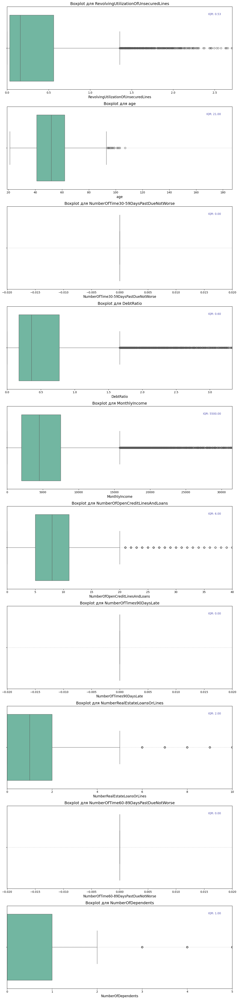

In [27]:
def plot_boxplots_for_features(df):
    num_features = len(df.columns)
    plt.figure(figsize=(12, 5 * num_features))

    for i, feature in enumerate(df.columns):
        ax = plt.subplot(num_features, 1, i + 1)
        df_melt = pd.melt(df, value_vars=[feature])
        sns.boxplot(x=df_melt['value'], palette="Set2", ax=ax)
        ax.set_title(f'Boxplot для {feature}', fontsize=14)
        ax.set_xlabel(f'{feature}', fontsize=12)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = max(0, Q1 - 1.5 * IQR)
        upper_bound = Q3 + 1.5 * IQR
        if lower_bound == upper_bound:
            lower_bound -= 0.01
            upper_bound += 0.01
        ax.set_xlim(2*lower_bound, 2*upper_bound)

        ax.annotate(f'IQR: {IQR:.2f}', xy=(0.95, 0.9), xycoords='axes fraction',
                    ha='right', fontsize=10, color='darkblue', alpha=0.7)

    plt.tight_layout()
    plt.show()

target_column = 'SeriousDlqin2yrs'
train_no_target = train_rf.drop(target_column, axis=1)
plot_boxplots_for_features(train_no_target)

In [28]:
print(train_rf['SeriousDlqin2yrs'].unique()) # только 2 уникальных значения - всё в норме.
print(train_rf['NumberOfTime30-59DaysPastDueNotWorse'].unique()) # значения выше 15 - аномалия.
print(train_rf['NumberOfOpenCreditLinesAndLoans'].unique()) # кажется, что больше 10 открытых кредитов - это явная аномалия.
print(train_rf['NumberOfTimes90DaysLate'].unique()) # более 4 случаев - аномалия.
print(train_rf['NumberRealEstateLoansOrLines'].unique()) # более 5 случаев - аномалия.
print(train_rf['NumberOfTime60-89DaysPastDueNotWorse'].unique()) # более 5 случаев - аномалия.
print(train_rf['NumberOfDependents'].unique()) # будем считать, что наличие более 4 иждивенцев - аномалия.

[1 0]
[ 2  0  1  3  4  5  7 10  6 98 12  8  9 96 13 11]
[13  4  2  5  7  3  8  9  6 10 14 22 17  1 15 31 12 21 11 19 18 26 20 23
  0 16 27 29 28 24 25 32 46 33 30 34 37 38 36 35 54 43 45 49 57 48 40 58
 51 52 39 41 56 42 47 50 44 53]
[ 0  1  3  2  5  4 98 10  9  6  7  8 15 96 11 13 14 17 12]
[ 6  0  1  3  4  2  5  8  7  9 17 10 12 11 16 26 14 54 21 18 13 23 15 29
 25 19 20 32]
[ 0  1  2  5  3 98  4  6  7  8 96 11  9]
[ 2  1  0  3  4  5  6  8  7 20 10  9 13]


Разберём более детально распределение каждого признака:
- SeriousDlqin2yrs: согласно условию, целевая переменная принимает только 0/1, значит всё остальное - выбросы.
- RevolvingUtilizationOfUnsecuredLines: превышение кредитного лимита со стороны заёмщика(>1) возможен, но считается нежелательным, в зависимости от финансовой организации критическая доля превышения может варьироваться. Предложение - сделать порог в 1.4;
- age: возраст заёмщика также может быть выбросом - лица младше 18 лет не могут брать на себя кредитные обязательства, также важно посмотреть и на верхнюю границу, предлагаемая граница: 18-90 лет.
- NumberOfTime30-59DaysPastDueNotWorse: значения выше 15 случаев можно считать аномальными.
- DebtRatio: исходя из диаграммы, можно считать, что выбросами будут значения выше 1.7;
- MonthlyIncome: Исходя из диаграммы можно обозначить верхнюю границу в 30000 уе, а нижнюю - в 1000 (на самом деле, может быть такое, что при отсутствии дохода также могут выдавать кредит, например, образовательный).
- NumberOfOpenCreditLinesAndLoans: более 10 открытых кредитов - аномалия.
- NumberOfTimes90DaysLate: просрочка кредита более, чем на 90 дней считается уже серьёзной проблемой, таким образом, будем считать, что более 4 случаев считаются аномалиями.
- NumberRealEstateLoansOrLines: исходя из диаграммы - более 5 займов под недвижимость являются аномалиями.
- NumberOfTime60-89DaysPastDueNotWorse: инцидент просрочки кредита 60-89 дней уже считается серьёзной проблемой, будем считать, что более 6 таких случаев будут считаться аномальными.
- NumberOfDependents: будем считать, что более 4 иждивенцев у заёмщика будет являться аномалией.

In [29]:
def filter_anomalies(df):
    return df[
        (df['RevolvingUtilizationOfUnsecuredLines'] <= 1.4) &
        (df['age'] >= 18) &
        (df['age'] <= 90) &
        (df['NumberOfTime30-59DaysPastDueNotWorse'] <= 15) &
        (df['DebtRatio'] <= 1.7) &
        (df['MonthlyIncome'] >= 1000) & (df['MonthlyIncome'] <= 30000) &
        (df['NumberOfOpenCreditLinesAndLoans'] <= 10) &
        (df['NumberRealEstateLoansOrLines'] <= 5) &
        (df['NumberOfTime60-89DaysPastDueNotWorse'] <= 6) &
        (df['NumberOfDependents'] <= 4)
    ]

train = filter_anomalies(train_rf)
test = filter_anomalies(test_rf)

In [30]:
print(train.shape)
print(test.shape)

(78179, 11)
(53999, 11)


Подходы к решению проблемы дисбаланса классов:

- Oversampling: дублируем меньший класс до тех пор, пока классов не станет поровну.
- Undersampling: идея та же, но уменьшаем бОльший класс.
- SMOTE: продвинутый подход - по сути, представляет собой улучшенный Oversampling. Преимущество метода - классы с меньшей долей компенсируются не просто полным дублированием, а линейной комбинацией.
- ADASYN: похож на SMOTE, но особенность данного метода в том, что он генерирует объекты рядом с исходными объектами, которые были неверно классфицированы при помощи KNN. Обучаем KNN и смотрим на объектах меньшего класса, где был неверно дан прогноз и затем уже происходит генерация.
- Tomek links: базирован на Undersampling. Идея в том, что метод находит 2 близких объекта разных классов и удаляет бОльший по доле класс.
- SMOTEK: комбинация методов SMOTE + Tomeklinks. Сначала Oversampling (SMOTE), затем Undersampling (Tomek links)
- Class weights: задаём веса согласно распределению классов. В моём понимании - приоритетный метод, поскольку подходы выше глобально основаны на 2-ух подходах - уменьшить данные (плохо для обучения модели), либо разными хитрыми/примитивными способами создать синтетические данные, которые фактически не дают новой информации.

In [31]:
X = train_rf.drop('SeriousDlqin2yrs', axis = 1)
y = train_rf['SeriousDlqin2yrs']

class_weights = compute_class_weight('balanced', classes = np.unique(y), y = y)
class_weights_dict = dict(enumerate(class_weights))

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size = 0.25, random_state = 42, stratify = y_train)

print("Train size:", X_train.shape, "Validation size:", X_val.shape, "Test size:", X_test.shape)

Train size: (87337, 10) Validation size: (29113, 10) Test size: (29113, 10)


В качестве модели используем логистическую регрессию, так как она может честно предсказывать вероятности, но сначала нужно стандартизировать данные.

In [32]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

Задача анализа - выявить всех неблагонадежных заемщиков (то есть тех, кто может привести к убыткам) в результате дефолта. Важно минимизировать ошибку, когда дефолтного заёмщика мы относим к надёжному.


Особенность метрик точности и полноты зависит от порога вероятности, по которому мы относим относим класс к положительному. Вариант - итеративно пройтись от дефолтного порога в 0.5 и в качестве критерия остановки выбрать наибольший F1-score.

In [33]:
logreg = LogisticRegression(class_weight=class_weights_dict, random_state=42, max_iter=1000)
logreg.fit(X_train, y_train)
y_val_probs = logreg.predict_proba(X_val)[:, 1]


thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0.5  # дефолтный порог

for current_threshold in thresholds:
    y_val_pred_thresholded = (y_val_probs >= current_threshold).astype(int)
    current_f1 = f1_score(y_val, y_val_pred_thresholded)

    if current_f1 > best_f1:
        best_f1 = current_f1
        best_threshold = current_threshold


y_val_pred_best = (y_val_probs >= best_threshold).astype(int)
precision = precision_score(y_val, y_val_pred_best)
recall = recall_score(y_val, y_val_pred_best)
f1 = f1_score(y_val, y_val_pred_best)


print(f"Best Threshold: {best_threshold:.2f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print("Classification Report:\n", classification_report(y_val, y_val_pred_best))

Best Threshold: 0.61
Precision: 0.3360
Recall: 0.4786
F1-Score: 0.3948
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95     27147
           1       0.34      0.48      0.39      1966

    accuracy                           0.90     29113
   macro avg       0.65      0.71      0.67     29113
weighted avg       0.92      0.90      0.91     29113



Проанализируем данные метрики качества:
- Precision: доля верно предсказанных дефолтов среди всех предсказанных дефолтов. Данная метрика может быть невалидна в случае дисбаланса классов.
- Recall: доля всех реальных дефолтов среди всех фактически дефолтных заемщиков.  Недооценка этого параметра приведет к пропущенным рисковым заемщикам, что является критичным. Однако может быть невалидна в случае дисбаланса классов.
- F1-score: по своей сути - среднее, зависящее от точности и полноты.
- ROC-AUC: хорошая метрика, которая не требует установки порога вероятности. В данной задаче может помочь более подходящая метрика, схожая с вышеупомянутой - PR-AUC.

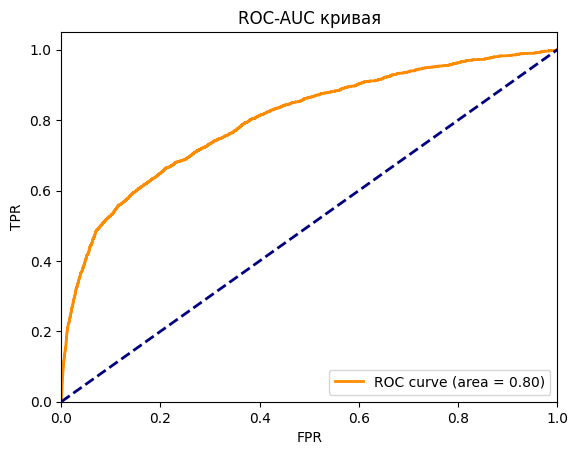

In [34]:
fpr, tpr, thresholds = roc_curve(y_val, y_val_probs)
roc_auc = auc(fpr, tpr)


plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Линия случайного угадывания
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC кривая')
plt.legend(loc='lower right')
plt.show()

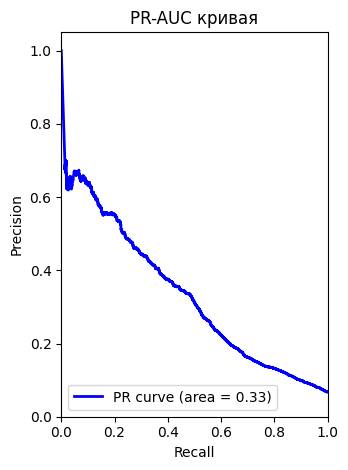

In [35]:
precision, recall, pr_thresholds = precision_recall_curve(y_val, y_val_probs)
pr_auc = auc(recall, precision)

plt.subplot(1, 2, 2)  # (1 строка, 2 столбца, график 2)
plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR-AUC кривая')
plt.legend(loc='lower left')


plt.tight_layout()
plt.show()

Метрики получились не самые лучшие - PR-AUC=0.33, F1-Score=0.4. Попробуем подобрать гиперпараметры + проверить валидность результатов с помощью GridSearchCV.

In [37]:
lr_upd = LogisticRegression(class_weight=class_weights_dict, random_state=42, max_iter=1000)
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'solver': ['liblinear', 'saga'],
    'l1_ratio': [0, 0.5, 1]
}


grid_search = GridSearchCV(lr_upd, param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_logreg = grid_search.best_estimator_
y_val_probs = best_logreg.predict_proba(X_val)[:, 1]

thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0.5

for current_threshold in thresholds:
    y_val_pred_thresholded = (y_val_probs >= current_threshold).astype(int)
    current_f1 = f1_score(y_val, y_val_pred_thresholded)
    if current_f1 > best_f1:
        best_f1 = current_f1
        best_threshold = current_threshold

# Предсказания с использованием оптимального порога
y_val_pred_best = (y_val_probs >= best_threshold).astype(int)

# Метрики
precision = precision_score(y_val, y_val_pred_best)
recall = recall_score(y_val, y_val_pred_best)
f1 = f1_score(y_val, y_val_pred_best)

print("Лучший порог:", best_threshold)
print("Лучшие параметры модели:", grid_search.best_params_)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Classification Report:\n", classification_report(y_val, y_val_pred_best))

Лучший порог: 0.61
Лучшие параметры модели: {'C': 10, 'l1_ratio': 0, 'penalty': 'l1', 'solver': 'liblinear'}
Precision: 0.33595144591217424
Recall: 0.47863682604272634
F1-Score: 0.394797566603734
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95     27147
           1       0.34      0.48      0.39      1966

    accuracy                           0.90     29113
   macro avg       0.65      0.71      0.67     29113
weighted avg       0.92      0.90      0.91     29113



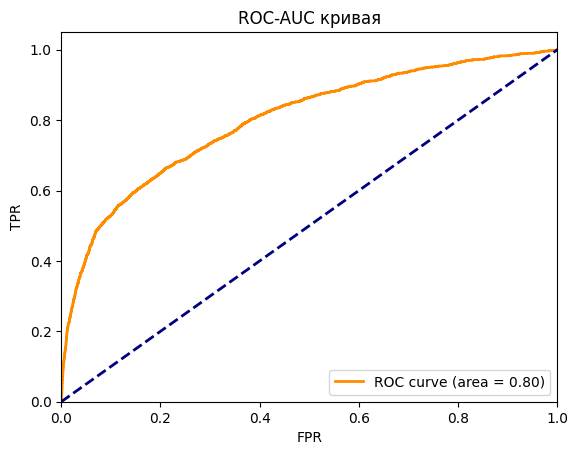

In [38]:
fpr, tpr, roc_thresholds = roc_curve(y_val, y_val_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC кривая')
plt.legend(loc='lower right')
plt.show()

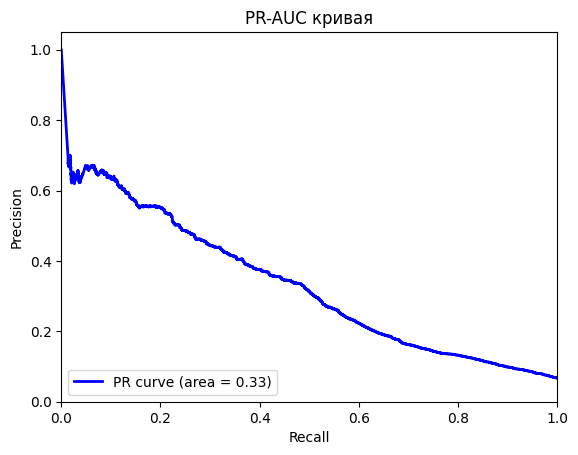

In [39]:
precision, recall, pr_thresholds = precision_recall_curve(y_val, y_val_probs)
pr_auc = auc(recall, precision)

plt.figure()
plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR-AUC кривая')
plt.legend(loc='lower left')
plt.show()

Кажется, что логистическая регрессия слишком простой алгоритм для данного рода задачи.Действительно, данные могут иметь и нелинейную связь. Воспользуемся теперь CatBoost'ом- более мощным алгоритмом, способным находить нелинейные связи.

In [46]:
catboost_model = CatBoostClassifier(random_seed=42, verbose=0, class_weights=class_weights_dict)
catboost_model.fit(X_train, y_train)
y_val_probs = catboost_model.predict_proba(X_val)[:, 1]

thresholds = np.arange(0.0, 1.0, 0.01)


best_f1 = 0
best_threshold = 0.5

for current_threshold in thresholds:
    y_val_pred_thresholded = (y_val_probs >= current_threshold).astype(int)
    current_f1 = f1_score(y_val, y_val_pred_thresholded)

    if current_f1 > best_f1:
        best_f1 = current_f1
        best_threshold = current_threshold


y_val_pred_best = (y_val_probs >= best_threshold).astype(int)
precision = precision_score(y_val, y_val_pred_best)
recall = recall_score(y_val, y_val_pred_best)
f1 = f1_score(y_val, y_val_pred_best)


print(f"Лучший порог: {best_threshold:.2f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print("Classification Report:\n", classification_report(y_val, y_val_pred_best))

Лучший порог: 0.76
Precision: 0.4066
Recall: 0.5061
F1-Score: 0.4509
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.95     27147
           1       0.41      0.51      0.45      1966

    accuracy                           0.92     29113
   macro avg       0.69      0.73      0.70     29113
weighted avg       0.93      0.92      0.92     29113



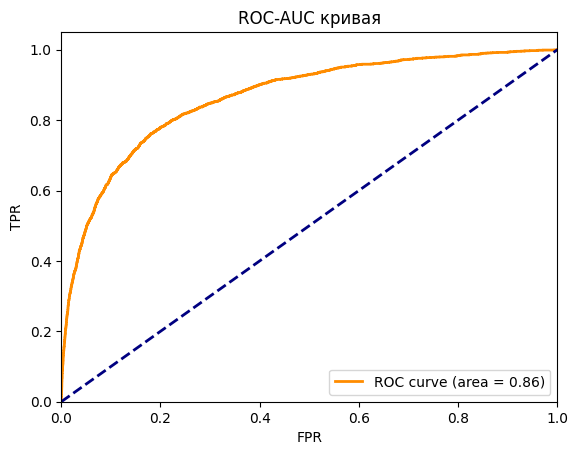

In [41]:
fpr, tpr, roc_thresholds = roc_curve(y_val, y_val_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC кривая')
plt.legend(loc='lower right')
plt.show()

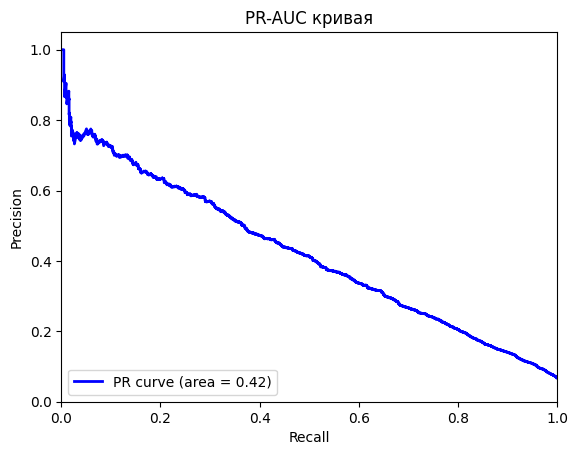

In [42]:
precision, recall, pr_thresholds = precision_recall_curve(y_val, y_val_probs)
pr_auc = auc(recall, precision)

plt.figure()
plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR-AUC кривая')
plt.legend(loc='lower left')
plt.show()

In [54]:
catboost_calibr = CatBoostClassifier(random_seed=42, verbose=0, class_weights=class_weights_dict, iterations = 500)
catboost_calibr.fit(X_train, y_train)

# Калибровка вероятностей с использованием IsotonicRegression
calibrated_model = CalibratedClassifierCV(catboost_calibr, method='isotonic', cv='prefit')

# Обучаем калибровку на валидационном наборе
calibrated_model.fit(X_val, y_val)

# Получаем откалиброванные вероятности
calibrated_probabilities = calibrated_model.predict_proba(X_val)[:, 1]

# Оценка качества модели (например, с использованием ROC AUC)
roc_auc = roc_auc_score(y_val, calibrated_probabilities)
print(f'ROC AUC после калибровки: {roc_auc}')

pr_auc = average_precision_score(y_val, calibrated_probabilities)
print(f'PR AUC после калибровки: {pr_auc}')

ROC AUC после калибровки: 0.867094747443565
PR AUC после калибровки: 0.4076642831464127


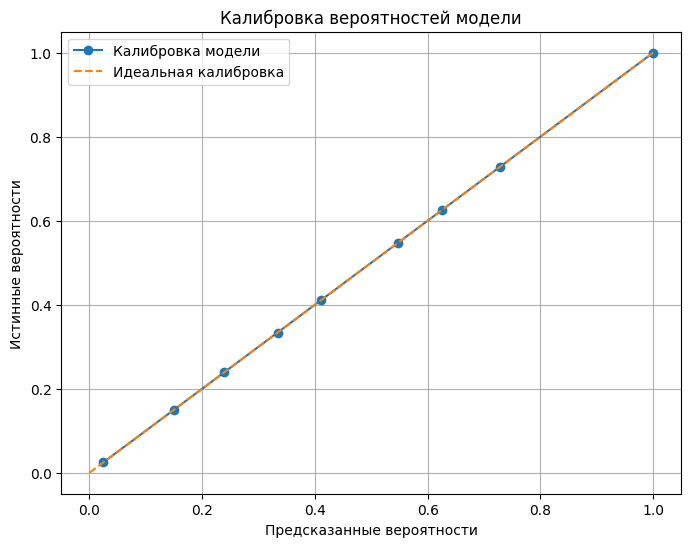

In [57]:
prob_true, prob_pred = calibration_curve(y_val, calibrated_probabilities, n_bins=10)

# Строим сам график
plt.figure(figsize=(8, 6))
plt.plot(prob_pred, prob_true, marker='o', label='Калибровка модели')
plt.plot([0, 1], [0, 1], linestyle='--', label='Идеальная калибровка')  # Идеальная линия
plt.title('Калибровка вероятностей модели')
plt.xlabel('Предсказанные вероятности')
plt.ylabel('Истинные вероятности')
plt.legend()
plt.grid(True)
plt.show()

Метрики улучшились - и это ещё даже без подбора гиперпараметров на кросс-валидации.

In [61]:
catboost_gscv = CatBoostClassifier(random_seed=42, class_weights=class_weights_dict, verbose=0)

# Параметры для GridSearchCV
param_grid = {
    'iterations': [100, 200, 500],
    'learning_rate': [0.01, 0.1],
    'depth': [4, 6, 8]
}

# GridSearchCV на CatBoost без калибровки
grid_search = GridSearchCV(catboost_gscv, param_grid, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Получаем лучшие параметры
best_params = grid_search.best_params_

# Инициализация лучшей модели с подобранными параметрами
best_catboost = grid_search.best_estimator_

# Калибровка модели с использованием IsotonicRegression
calibrated_model = CalibratedClassifierCV(best_catboost, method='isotonic', cv='prefit')

# Обучение калибровки
calibrated_model.fit(X_val, y_val)

# Получаем откалиброванные вероятности
y_val_probs = calibrated_model.predict_proba(X_val)[:, 1]

# Поиск лучшего порога
thresholds = np.arange(0.0, 1.0, 0.01)

best_f1 = 0
best_threshold = 0.5

for current_threshold in thresholds:
    y_val_pred_thresholded = (y_val_probs >= current_threshold).astype(int)
    current_f1 = f1_score(y_val, y_val_pred_thresholded)

    if current_f1 > best_f1:
        best_f1 = current_f1
        best_threshold = current_threshold

# Прогноз с лучшим порогом
y_val_pred_best = (y_val_probs >= best_threshold).astype(int)

# Метрики
precision = precision_score(y_val, y_val_pred_best)
recall = recall_score(y_val, y_val_pred_best)
f1 = f1_score(y_val, y_val_pred_best)

# Вывод результатов
print(f"Лучший порог: {best_threshold:.2f}")
print(f"Лучшие параметры: {best_params}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print("Classification Report:\n", classification_report(y_val, y_val_pred_best))

Лучший порог: 0.22
Лучшие параметры: {'depth': 8, 'iterations': 500, 'learning_rate': 0.1}
Precision: 0.4205
Recall: 0.4776
F1-Score: 0.4472
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96     27147
           1       0.42      0.48      0.45      1966

    accuracy                           0.92     29113
   macro avg       0.69      0.71      0.70     29113
weighted avg       0.93      0.92      0.92     29113



In [ ]:
# prob_true, prob_pred = calibration_curve(y_val, calibrated_probabilities, n_bins=10)

# # Строим сам график
# plt.figure(figsize=(8, 6))
# plt.plot(prob_pred, prob_true, marker='o', label='Калибровка модели')
# plt.plot([0, 1], [0, 1], linestyle='--', label='Идеальная калибровка')  # Идеальная линия
# plt.title('Калибровка вероятностей модели')
# plt.xlabel('Предсказанные вероятности')
# plt.ylabel('Истинные вероятности')
# plt.legend()
# plt.grid(True)
# plt.show()

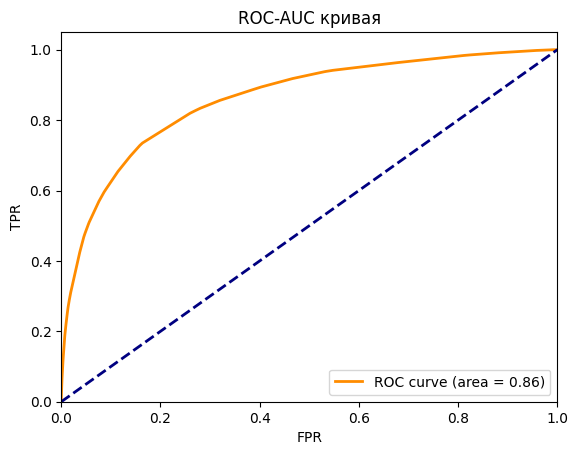

In [62]:
fpr, tpr, thresholds = roc_curve(y_val, y_val_probs)
roc_auc = auc(fpr, tpr)


plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Линия случайного угадывания
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC кривая')
plt.legend(loc='lower right')
plt.show()

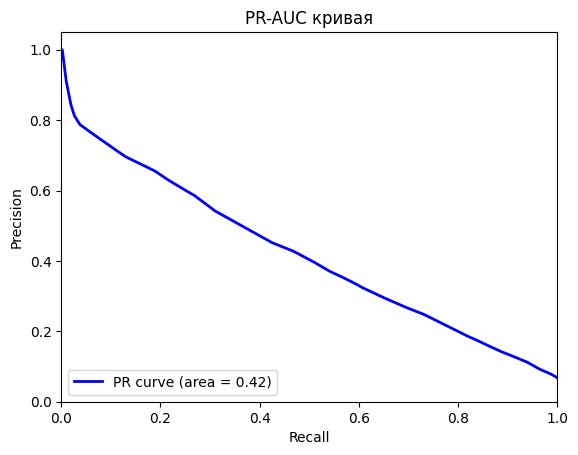

In [63]:
precision, recall, pr_thresholds = precision_recall_curve(y_val, y_val_probs)
pr_auc = auc(recall, precision)

plt.figure()
plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR-AUC кривая')
plt.legend(loc='lower left')
plt.show()